The Purpose of this Google Collab is to collect, visualize, and analyze important geological, economic and related data for the State of New Mexico for future analysis.

(c) Joaquin Roibal
5/17/2025 - V 0.01

# Exploratory Data Analysis - STATE LAND OFFICE LEASES


--- Initial Data Inspection ---

    UNIQUEKEY LSE_PREFIX  LSE_NUMBER  LSE_SUFFIX  STATUS ISSUE_DTE EXPR_DTE  \
0  ES01880000         ES       188.0         0.0  ACTIVE       NaT      NaT   
1  ES01670000         ES       167.0         0.0  ACTIVE       NaT      NaT   
2  EW00830001         EW        83.0         1.0  ACTIVE       NaT      NaT   
3  EW00970001         EW        97.0         1.0  ACTIVE       NaT      NaT   
4  ES01040000         ES       104.0         0.0  ACTIVE       NaT      NaT   

   LSE_ACRG       LEASE_TYPE SUBTYP_CDE LAND_USE  OGRID_CDE  \
0    40.150  Energy By Solar       None     None   724022.0   
1   160.000  Energy By Solar       None     None   751873.0   
2     2.482   Energy By Wind       None     None   741376.0   
3  7663.310   Energy By Wind       None     None   746422.0   
4    69.920  Energy By Solar       None     None   734806.0   

                      OGRID_NAM  \
0      US SOLAR DEVELOPMENT LLC   
1   Pluma Solar Silver City LLC   
2  Clin

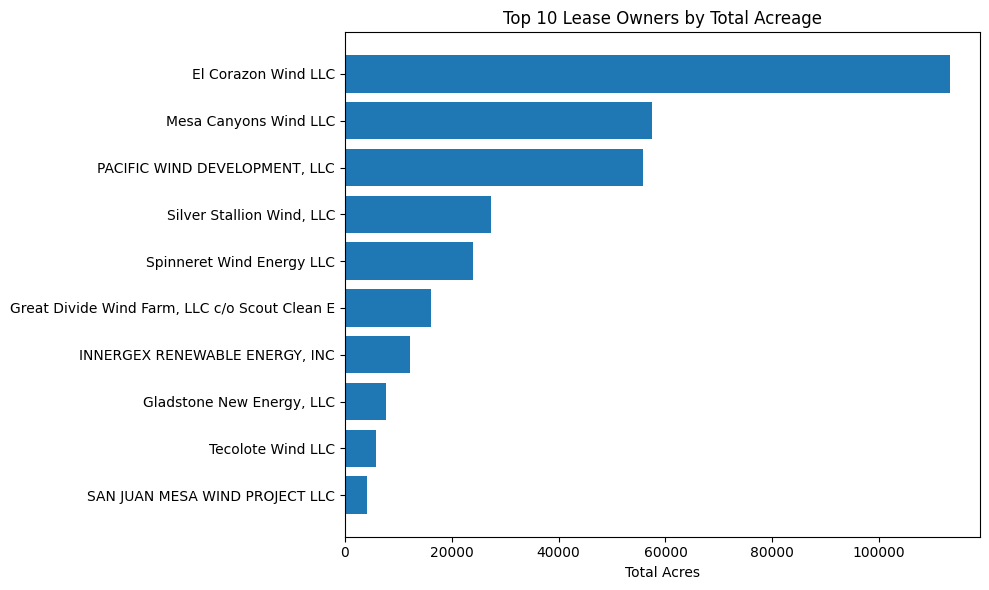


---LARGEST ENERGY LEASED ACREAGE---

     UNIQUEKEY LSE_PREFIX  LSE_NUMBER  LSE_SUFFIX  STATUS ISSUE_DTE EXPR_DTE  \
10  EW01060001         EW       106.0         1.0  ACTIVE       NaT      NaT   
12  EW00210000         EW        21.0         0.0  ACTIVE       NaT      NaT   
68  EW01110000         EW       111.0         0.0  ACTIVE       NaT      NaT   
42  EW00900000         EW        90.0         0.0  ACTIVE       NaT      NaT   
77  EW01010001         EW       101.0         1.0  ACTIVE       NaT      NaT   

    LSE_ACRG      LEASE_TYPE SUBTYP_CDE LAND_USE  OGRID_CDE  \
10  56680.74  Energy By Wind       None     None   743234.0   
12  35154.82  Energy By Wind       None     None   305536.0   
68  27382.00  Energy By Wind       None     None   759901.0   
42  23923.74  Energy By Wind       None     None   763413.0   
77  22137.85  Energy By Wind       None     None   743234.0   

                        OGRID_NAM  \
10            El Corazon Wind LLC   
12  PACIFIC WIND DEVELOPMENT

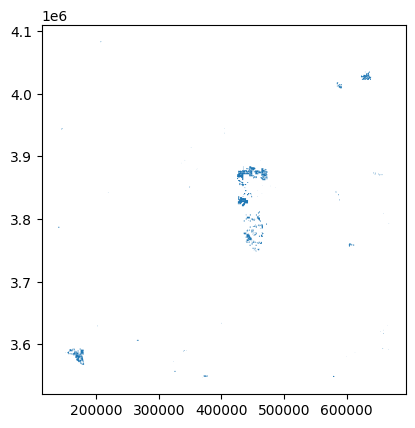

In [ ]:
#Exploring State Land Office Data - Energy Leases ( WIND - SOLAR )

import geopandas as gpd
import matplotlib.pyplot as plt
import pandas as pd


# Load geographic data for U.S. states
nm_SLO_energy_lease_shapefile = '/content/drive/MyDrive/New Mexico Analysis/slo_enleased.shp'

def exploratory_geodata_analysis(shapefile_path):
    """Performs initial exploratory analysis of geospatial data."""

    # Load the shapefile
    gdf = gpd.read_file(shapefile_path)

    print("\n--- Initial Data Inspection ---\n")
    print(gdf.head(), "\n")

    print("\n--- Data Types and Non-Null Counts ---\n")
    print(gdf.info(), "\n")

    print("\n--- Summary Statistics (Numerical Data) ---\n")
    numerical_summary = gdf.describe()
    print(numerical_summary, "\n")

    print("\n--- Unique Values (Categorical Data) ---\n")
    categorical_columns = gdf.select_dtypes(include=['object', 'category']).columns
    for col in categorical_columns:
        unique_vals = gdf[col].unique()
        num_unique = len(unique_vals)
        print(f"Column '{col}' has {num_unique} unique values:")
        if num_unique <= 20:
            print(unique_vals)
        else:
            print(unique_vals[:20], "... (truncated)")
        print()

    print("\n--- Coordinate Reference System (CRS) ---\n")
    print(gdf.crs, "\n")

    print("\n--- Geometry Types in Dataset ---\n")
    print(gdf.geom_type.value_counts(), "\n")

    print("\n--- Missing Data Analysis ---\n")
    missing_data = gdf.isnull().sum()
    print(missing_data[missing_data > 0], "\n")

    print("\n--- Spatial Extent (Bounding Box) ---\n")
    bounds = gdf.total_bounds
    print(f"X min: {bounds[0]}, Y min: {bounds[1]}, X max: {bounds[2]}, Y max: {bounds[3]}")
    print("\n--- Lease Counts and Total Acres by Owner ---")
    lease_summary = gdf.groupby('OGRID_NAM').agg(
        Lease_Count=('OGRID_NAM', 'size'),
        Total_Acres=('LSE_ACRG', 'sum')
    ).reset_index().sort_values(by='Total_Acres', ascending=False)
    print(lease_summary.head(10))

    # Plot the top 10 lease owners by total acres
    plt.figure(figsize=(10, 6))
    plt.barh(lease_summary['OGRID_NAM'].head(10)[::-1], lease_summary['Total_Acres'].head(10)[::-1])
    plt.xlabel('Total Acres')
    plt.title('Top 10 Lease Owners by Total Acreage')
    plt.tight_layout()
    plt.show()

    return gdf

# Example usage:
# Replace '../data/geology.shp' with your actual shapefile path
# LOADING WIND / SOLAR ENERGY LEASES
gdf_energy_leases = exploratory_geodata_analysis(nm_SLO_energy_lease_shapefile)

# Sort by a specific column in descending order
# sorting energy leases to see largest leased acreage
sorted_gdf_energy_leases = gdf_energy_leases.sort_values(by='LSE_ACRG', ascending=False)

# Display sorted results
print("\n---LARGEST ENERGY LEASED ACREAGE---\n")
print(sorted_gdf_energy_leases.head())

gdf_energy_leases.plot()
plt.show()

#nm_counties_shapefile = '/content/drive/MyDrive/New Mexico Analysis/Data/tl_2018_nm_county/tl_2018_nm_county.shp'

#gdf_counties = exploratory_geodata_analysis(nm_counties_shapefile)

#gdf_counties.plot()
#plt.show()



# Exploratory Data Analysis - Oil & Gas


--- Initial Data Inspection ---

    UNIQUEKEY LSE_PREFIX  LSE_NUMBER  LSE_SUFFIX  STATUS  LSE_ACRG VEREFF_DTE  \
0  A009830004         A0       983.0         4.0  ACTIVE   8360.76 1928-07-27   
1  A011180021         A0      1118.0        21.0  ACTIVE     40.43 1928-09-15   
2  A011180024         A0      1118.0        24.0  ACTIVE     40.00 1928-09-15   
3  A011180028         A0      1118.0        28.0  ACTIVE     81.10 1928-09-15   
4  A011180029         A0      1118.0        29.0  ACTIVE    398.06 1928-09-15   

   VERTRM_DTE  OGRID_CDE                   OGRID_NAM  \
0  9999/12/31   111592.0  KERR-MCGEE O/G ONSHORE, LP   
1  9999/12/31   217817.0      CONOCOPHILLIPS COMPANY   
2  9999/12/31    15262.0                 MOREXCO INC   
3  9999/12/31   157984.0      OCCIDENTAL PERMIAN LTD   
4  9999/12/31   157984.0      OCCIDENTAL PERMIAN LTD   

                                            geometry  
0  MULTIPOLYGON (((662066.175 3575095.837, 662072...  
1  POLYGON ((661218.403 3638332.

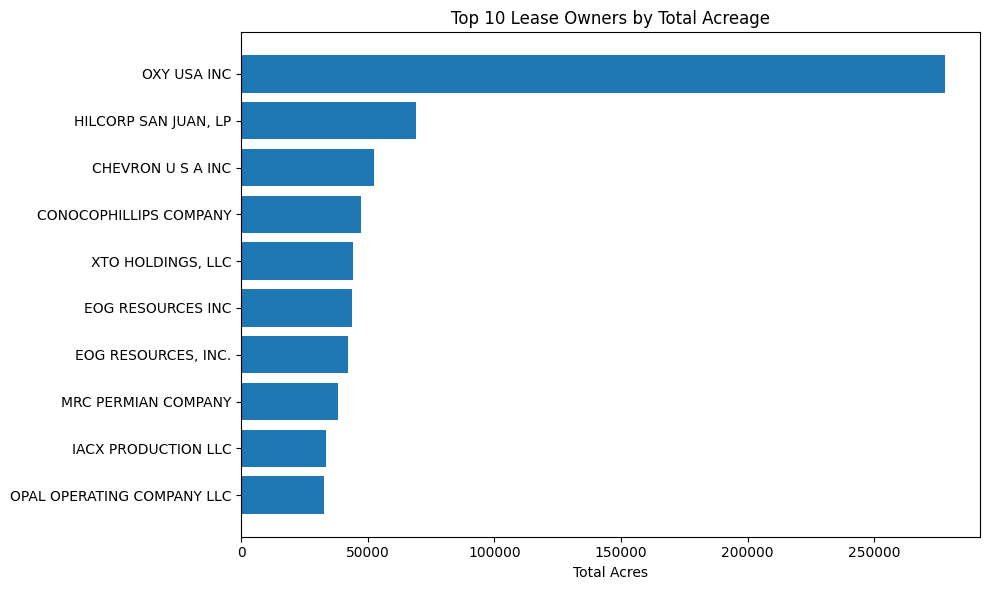


---LARGEST OIL GAS LEASED ACREAGE---

       UNIQUEKEY LSE_PREFIX  LSE_NUMBER  LSE_SUFFIX  STATUS  LSE_ACRG  \
0     A009830004         A0       983.0         4.0  ACTIVE   8360.76   
42    A026140000         A0      2614.0         0.0  ACTIVE   7200.84   
312   B017320001         B0      1732.0         1.0  ACTIVE   6366.46   
86    B002290001         B0       229.0         1.0  ACTIVE   5560.64   
5670  X006480154         X0       648.0       154.0  ACTIVE   5518.80   

     VEREFF_DTE  VERTRM_DTE  OGRID_CDE                   OGRID_NAM  \
0    1928-07-27  9999/12/31   111592.0  KERR-MCGEE O/G ONSHORE, LP   
42   1930-04-21  9999/12/31    86997.0             MARATHON OIL CO   
312  1933-02-28  9999/12/31     4323.0           CHEVRON U S A INC   
86   1928-02-28  9999/12/31     4323.0           CHEVRON U S A INC   
5670 1922-11-14  9999/12/31   327480.0    WPX ENERGY PERMIAN, LLC.   

                                               geometry  
0     MULTIPOLYGON (((662066.175 3575095.83

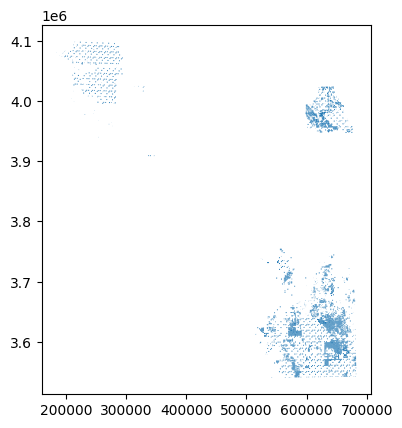

In [ ]:
nm_SLO_oilgas_lease_shapefile = '/content/drive/MyDrive/New Mexico Analysis/Data/SLO _ Oil and Gas/slo_ogleased.shp'

gdf_oilgas_leases = exploratory_geodata_analysis(nm_SLO_oilgas_lease_shapefile)

# sorting energy leases to see largest leased acreage
sorted_gdf_oilgas_leases = gdf_oilgas_leases.sort_values(by='LSE_ACRG', ascending=False)

# Display sorted results
print("\n---LARGEST OIL GAS LEASED ACREAGE---\n")
print(sorted_gdf_oilgas_leases.head())

gdf_oilgas_leases.plot()
plt.show()


# New Mexico Real Estate Data

# New Mexico County Housing Growth (2020-2024)

In [ ]:
# Install geopandas and dependencies if needed
#!pip install geopandas openpyxl matplotlib --quiet

import geopandas as gpd
import pandas as pd
import matplotlib.pyplot as plt

# File paths
nm_counties_shapefile = '/content/drive/MyDrive/New Mexico Analysis/Data/tl_2018_nm_county/tl_2018_nm_county.shp'
nm_housing_data = '/content/drive/MyDrive/New Mexico Analysis/Data/NM-EST2024-HU-35.xlsx'

# Load shapefile
gdf_counties = gpd.read_file(nm_counties_shapefile)

# Clean county names for consistency
gdf_counties['County'] = gdf_counties['NAME'].str.strip()

# Load housing data
df_housing = pd.read_excel(nm_housing_data, sheet_name="CO-EST2024-HU-35", skiprows=3)
df_housing.columns = ['Area', 'Code', '2020', '2021', '2022', '2023', '2024']
df_housing = df_housing[~df_housing['Area'].str.startswith('New Mexico')]

# Extract and clean county names
df_housing['County'] = df_housing['Area'].str.replace(r'^\.', '', regex=True).str.replace(', New Mexico', '', regex=False)

# Calculate percentage growth from 2020 to 2024
df_housing['Growth (%)'] = ((df_housing['2024'] - df_housing['2020']) / df_housing['2020']) * 100

# Merge spatial and tabular data
merged_gdf = gdf_counties.merge(df_housing[['County', 'Growth (%)']], on='County', how='left')

# Plot the map
fig, ax = plt.subplots(figsize=(12, 10))
merged_gdf.plot(column='Growth (%)',
                cmap='RdYlGn',
                edgecolor='black',
                linewidth=0.8,
                legend=True,
                ax=ax)

# Add labels at centroids
for idx, row in merged_gdf.iterrows():
    if row['geometry'].geom_type in ['Polygon', 'MultiPolygon']:
        centroid = row['geometry'].centroid
        plt.text(centroid.x, centroid.y, row['County'], fontsize=6, ha='center', color='black')

plt.title("New Mexico County Housing Unit Growth (2020–2024)", fontsize=16)
#plt.axis('off')
#plt.tight_layout()
#plt.show()


Text(0.5, 1.0, 'New Mexico County Housing Unit Growth (2020–2024)')

  STATEFP COUNTYFP  COUNTYNS  GEOID        NAME           NAMELSAD LSAD  \
0      35      011  00933054  35011     De Baca     De Baca County   06   
1      35      035  00929104  35035       Otero       Otero County   06   
2      35      003  00929108  35003      Catron      Catron County   06   
3      35      059  00929115  35059       Union       Union County   06   
4      35      047  00929114  35047  San Miguel  San Miguel County   06   

  CLASSFP  MTFCC CSAFP CBSAFP METDIVFP FUNCSTAT         ALAND      AWATER  \
0      H1  G4020  None   None     None        A  6.016819e+09  29089486.0   
1      H1  G4020  None  10460     None        A  1.712646e+10  36943378.0   
2      H1  G4020  None   None     None        A  1.793356e+10  14197373.0   
3      H1  G4020  None   None     None        A  9.906866e+09  15466855.0   
4      H1  G4020   106  29780     None        A  1.222867e+10  51380263.0   

      INTPTLAT      INTPTLON  \
0  +34.3592729  -104.3686961   
1  +32.6155988  -105.7

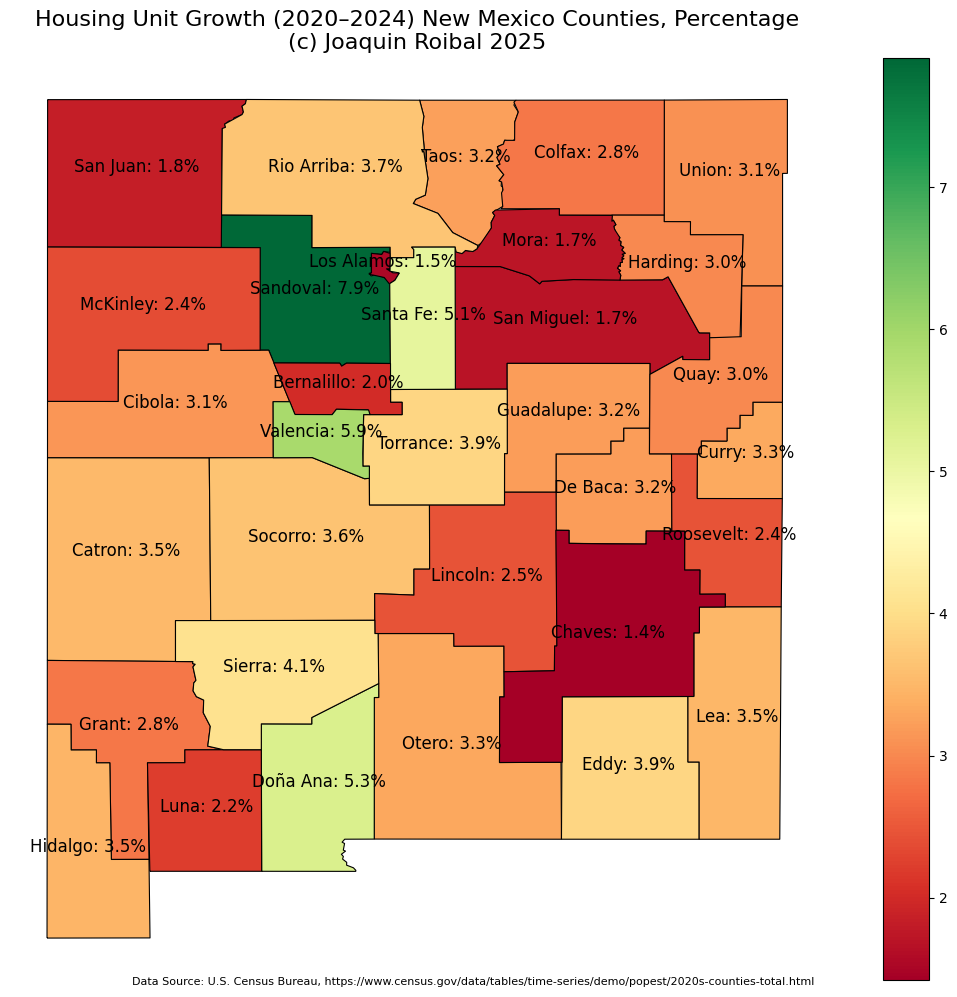

In [ ]:
# Install required libraries
#!pip install geopandas openpyxl matplotlib --quiet

import geopandas as gpd
import pandas as pd
import matplotlib.pyplot as plt

# File paths
nm_counties_shapefile = '/content/drive/MyDrive/New Mexico Analysis/Data/tl_2018_nm_county/tl_2018_nm_county.shp'
nm_housing_data = '/content/drive/MyDrive/New Mexico Analysis/Data/NM-EST2024-HU-35.xlsx'

# Load New Mexico county shapefile
gdf_counties = gpd.read_file(nm_counties_shapefile)
gdf_counties['County'] = gdf_counties['NAMELSAD'].str.strip()
print(gdf_counties.head())

# Load housing data and calculate growth %
df_housing = pd.read_excel(nm_housing_data, sheet_name="CO-EST2024-HU-35", skiprows=3)
df_housing.columns = ['Area', 'Code', '2020', '2021', '2022', '2023', '2024']
df_housing = df_housing[~df_housing['Area'].str.startswith('New Mexico')]
df_housing['County'] = df_housing['Area'].str.replace(r'^\.', '', regex=True).str.replace(', New Mexico', '', regex=False)
df_housing['Growth (%)'] = ((df_housing['2024'] - df_housing['2020']) / df_housing['2020']) * 100
print(df_housing.head())
# Merge geodataframe with housing growth data
merged_gdf = gdf_counties.merge(df_housing[['County', 'Growth (%)']], on='County', how='left')
#print(merged_gdf.info())
#print(merged_gdf.head())
# Simplify geometries to speed up plotting
merged_gdf['geometry'] = merged_gdf['geometry'].simplify(0.01)

# Plot map
fig, ax = plt.subplots(figsize=(12, 10))
merged_gdf.plot(column='Growth (%)',
                cmap='RdYlGn',
                edgecolor='black',
                linewidth=0.8,
                legend=True,
                ax=ax)

# (Optional) Label only the top 5 fastest-growing counties
#top5 = merged_gdf.sort_values(by='Growth (%)', ascending=False).head(5)
#for idx, row in top5.iterrows():
#    centroid = row['geometry'].centroid
#    ax.annotate(row['County'], xy=(centroid.x, centroid.y), fontsize=8, ha='center', color='black')

#print("\n\n--- FINAL MERGED GEODATAFRAME: --- \n\n", merged_gdf)
# Add labels at centroids
for idx, row in merged_gdf.iterrows():
    if row['geometry'].geom_type in ['Polygon', 'MultiPolygon']:
        centroid = row['geometry'].centroid
        plt.text(centroid.x, centroid.y, str(row['NAME'])+ ": " + str(round(row['Growth (%)'], 1)) + "%", fontsize=12, ha='center', color='black')

plt.figtext(0.5, 0.01,
            'Data Source: U.S. Census Bureau, https://www.census.gov/data/tables/time-series/demo/popest/2020s-counties-total.html',
            wrap=True, horizontalalignment='center', fontsize=8)

plt.title("Housing Unit Growth (2020–2024) New Mexico Counties, Percentage\n(c) Joaquin Roibal 2025", fontsize=16)
plt.axis('off')
plt.tight_layout()
plt.show()

# Sandoval County Real Estate Data Analysis


--- Initial Data Inspection ---

    UNIQUEKEY LSE_PREFIX  LSE_NUMBER  LSE_SUFFIX  STATUS ISSUE_DTE EXPR_DTE  \
0  ES01880000         ES       188.0         0.0  ACTIVE       NaT      NaT   
1  ES01670000         ES       167.0         0.0  ACTIVE       NaT      NaT   
2  EW00830001         EW        83.0         1.0  ACTIVE       NaT      NaT   
3  EW00970001         EW        97.0         1.0  ACTIVE       NaT      NaT   
4  ES01040000         ES       104.0         0.0  ACTIVE       NaT      NaT   

   LSE_ACRG       LEASE_TYPE SUBTYP_CDE LAND_USE  OGRID_CDE  \
0    40.150  Energy By Solar       None     None   724022.0   
1   160.000  Energy By Solar       None     None   751873.0   
2     2.482   Energy By Wind       None     None   741376.0   
3  7663.310   Energy By Wind       None     None   746422.0   
4    69.920  Energy By Solar       None     None   734806.0   

                      OGRID_NAM  \
0      US SOLAR DEVELOPMENT LLC   
1   Pluma Solar Silver City LLC   
2  Clin

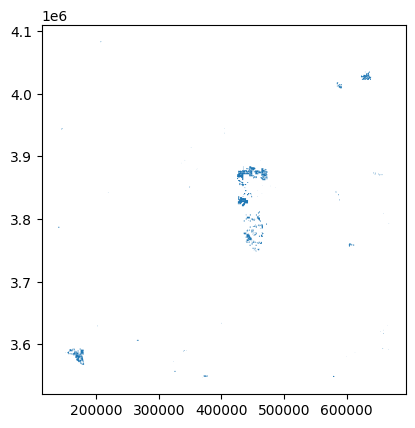


--- Initial Data Inspection ---

  STATEFP COUNTYFP  COUNTYNS  GEOID        NAME           NAMELSAD LSAD  \
0      35      011  00933054  35011     De Baca     De Baca County   06   
1      35      035  00929104  35035       Otero       Otero County   06   
2      35      003  00929108  35003      Catron      Catron County   06   
3      35      059  00929115  35059       Union       Union County   06   
4      35      047  00929114  35047  San Miguel  San Miguel County   06   

  CLASSFP  MTFCC CSAFP CBSAFP METDIVFP FUNCSTAT         ALAND      AWATER  \
0      H1  G4020  None   None     None        A  6.016819e+09  29089486.0   
1      H1  G4020  None  10460     None        A  1.712646e+10  36943378.0   
2      H1  G4020  None   None     None        A  1.793356e+10  14197373.0   
3      H1  G4020  None   None     None        A  9.906866e+09  15466855.0   
4      H1  G4020   106  29780     None        A  1.222867e+10  51380263.0   

      INTPTLAT      INTPTLON  \
0  +34.3592729  -104

<ipython-input-17-65cd5680cb83>:103: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  centroid = sandoval.geometry.centroid.iloc[0]


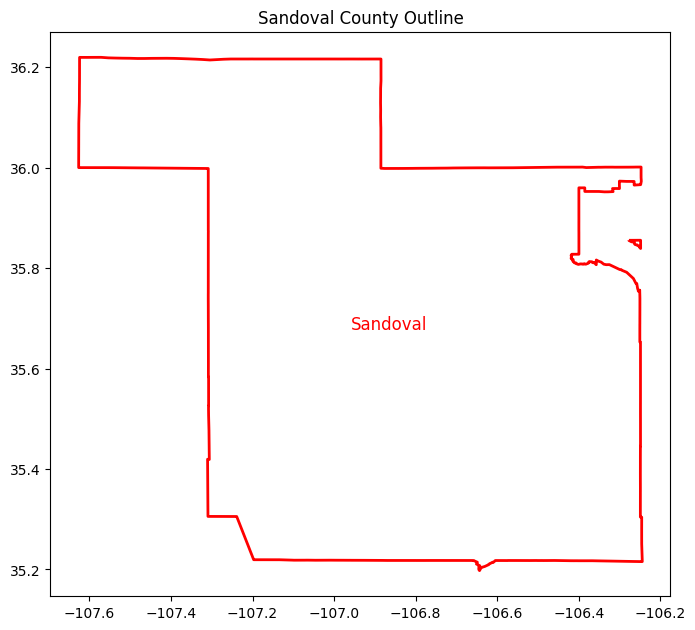



---ROADS EXPLORATORY ANALYSIS---



--- Initial Data Inspection ---

   SEGMENT_ID  L_ADD_LOW  L_ADD_HIGH  R_ADD_LOW  R_ADD_HIGH STR_DIR  \
0           0         12          16         11          15    None   
1           0          2          74          1          75    None   
2           0          2          54          1          53    None   
3           0          2          12          1          11    None   
4           0          0           0          0           0    None   

  STR_PRETYP                STR_NAME STR_SUFFIX POST_DIR  ...   DATE_UPD  \
0       None        SANGRE DE CRISTO         DR     None  ... 2019-01-01   
1       None          STRAIGHT CREEK        TRL     None  ... 2019-01-01   
2       None          CALLE CONTENTO       None     None  ... 2019-01-01   
3       None                ROSEMARY         CT     None  ... 2019-01-01   
4       None  INTERSTATE 40 OFF RAMP       None     None  ... 2019-01-01   

  NO_MSAG created_us created_da last_edite la

<ipython-input-17-65cd5680cb83>:124: DeprecationWarning: The 'unary_union' attribute is deprecated, use the 'union_all()' method instead.
  roads_in_sandoval = roads[roads.geometry.intersects(sandoval.unary_union)]


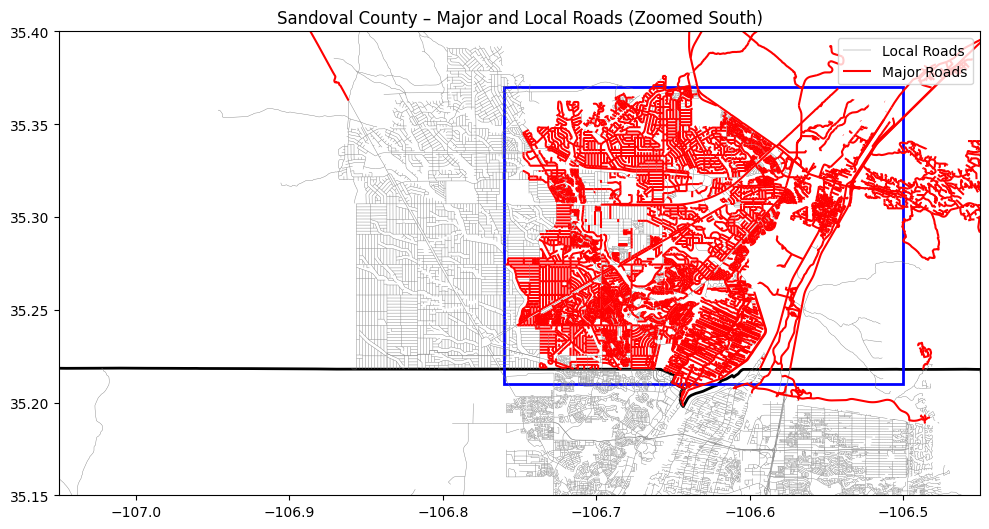

'\n\n# Plot\nax = sandoval.plot(edgecolor=\'red\', facecolor=\'none\', linewidth=2, figsize=(10, 10))\nroads_in_sandoval.plot(ax=ax, color=\'gray\', linewidth=0.5)\n#cities_in_sandoval.plot(ax=ax, color=\'blue\', markersize=20)\n\n# Add labels\n#for idx, row in cities_in_sandoval.iterrows():\n#    plt.text(row.geometry.x, row.geometry.y, row[\'NAME\'], fontsize=8)\n\n# Add text label for \'Sandoval\' at the centroid\ncentroid = sandoval.geometry.centroid.iloc[0]\nplt.text(centroid.x, centroid.y, \'Sandoval\', fontsize=12, ha=\'center\', va=\'center\', color=\'red\')\n\nplt.title("Sandoval County with Roads and Cities")\n#plt.axis(\'off\')\nplt.show()'

In [ ]:
#from os import name
#Exploring NEW MEXICO REAL ESTATE DATA

from matplotlib.patches import Rectangle

import geopandas as gpd
import matplotlib.pyplot as plt
import pandas as pd


# Load geographic data for U.S. states
nm_SLO_energy_lease_shapefile = '/content/drive/MyDrive/New Mexico Analysis/slo_enleased.shp'

def exploratory_geodata_analysis(shapefile_path):
    """Performs initial exploratory analysis of geospatial data."""

    # Load the shapefile
    gdf = gpd.read_file(shapefile_path)

    print("\n--- Initial Data Inspection ---\n")
    print(gdf.head(), "\n")

    print("\n--- Data Types and Non-Null Counts ---\n")
    print(gdf.info(), "\n")

    print("\n--- Summary Statistics (Numerical Data) ---\n")
    numerical_summary = gdf.describe()
    print(numerical_summary, "\n")

    print("\n--- Unique Values (Categorical Data) ---\n")
    categorical_columns = gdf.select_dtypes(include=['object', 'category']).columns
    for col in categorical_columns:
        unique_vals = gdf[col].unique()
        num_unique = len(unique_vals)
        print(f"Column '{col}' has {num_unique} unique values:")
        if num_unique <= 20:
            print(unique_vals)
        else:
            print(unique_vals[:20], "... (truncated)")
        print()

    print("\n--- Coordinate Reference System (CRS) ---\n")
    print(gdf.crs, "\n")

    print("\n--- Geometry Types in Dataset ---\n")
    print(gdf.geom_type.value_counts(), "\n")

    print("\n--- Missing Data Analysis ---\n")
    missing_data = gdf.isnull().sum()
    print(missing_data[missing_data > 0], "\n")

    print("\n--- Spatial Extent (Bounding Box) ---\n")
    bounds = gdf.total_bounds
    print(f"X min: {bounds[0]}, Y min: {bounds[1]}, X max: {bounds[2]}, Y max: {bounds[3]}")
    """print("\n--- Lease Counts and Total Acres by Owner ---")
    lease_summary = gdf.groupby('OGRID_NAM').agg(
        Lease_Count=('OGRID_NAM', 'size'),
        Total_Acres=('LSE_ACRG', 'sum')
    ).reset_index().sort_values(by='Total_Acres', ascending=False)
    print(lease_summary.head(10))

    # Plot the top 10 lease owners by total acres
    plt.figure(figsize=(10, 6))
    plt.barh(lease_summary['OGRID_NAM'].head(10)[::-1], lease_summary['Total_Acres'].head(10)[::-1])
    plt.xlabel('Total Acres')
    plt.title('Top 10 Lease Owners by Total Acreage')
    plt.tight_layout()
    plt.show()
    """
    return gdf

# Example usage:
# Replace '../data/geology.shp' with your actual shapefile path
# LOADING WIND / SOLAR ENERGY LEASES
gdf_energy_leases = exploratory_geodata_analysis(nm_SLO_energy_lease_shapefile)

# Sort by a specific column in descending order
# sorting energy leases to see largest leased acreage
sorted_gdf_energy_leases = gdf_energy_leases.sort_values(by='LSE_ACRG', ascending=False)

# Display sorted results
print("\n---LARGEST ENERGY LEASED ACREAGE---\n")
print(sorted_gdf_energy_leases.head())

gdf_energy_leases.plot()
plt.show()

nm_housing_data = '/content/drive/MyDrive/New Mexico Analysis/Data/NM-EST2024-HU-35.xlsx'
nm_counties_shapefile = '/content/drive/MyDrive/New Mexico Analysis/Data/tl_2018_nm_county/tl_2018_nm_county.shp'

gdf_counties = exploratory_geodata_analysis(nm_counties_shapefile)

#gdf_counties[gdf_counties['NAME']=='Sandoval'].plot()
#plt.show()

# Filter to just Sandoval County
sandoval = gdf_counties[gdf_counties['NAME'].str.strip().str.lower() == 'sandoval']

# Plot with red border, no fill
ax = sandoval.plot(edgecolor='red', facecolor='none', linewidth=2, figsize=(8, 8))

# Add text label for 'Sandoval' at the centroid
centroid = sandoval.geometry.centroid.iloc[0]
plt.text(centroid.x, centroid.y, 'Sandoval', fontsize=12, ha='center', va='center', color='red')

plt.title("Sandoval County Outline")
#plt.axis('off')
plt.show()

#Add additional features in Sandoval County
print("\n\n---ROADS EXPLORATORY ANALYSIS---\n\n")
roads = exploratory_geodata_analysis('/content/drive/MyDrive/New Mexico Analysis/Data/NM911_RCL_202504/NM911_RCL_202504.shp')  # Example
#cities = gpd.read_file('tl_2024_35_place.shp')

# Reproject roads to match Sandoval CRS
roads = roads.to_crs(sandoval.crs)

# (Optional) Check they're the same
#print(roads.crs)
#print(sandoval.crs)
print(roads['RD_CLASS'].unique())
# Filter roads and cities within Sandoval's geometry
#roads_in_sandoval = roads[roads.geometry.within(sandoval.union_all())]
roads_in_sandoval = roads[roads.geometry.intersects(sandoval.unary_union)]
#cities_in_sandoval = cities[cities.geometry.within(sandoval.unary_union)]

# Add a new column to classify road type
def classify_road(rd_class):
    major_codes = ['A00', 'A11', 'A21', 'A30', 'A31', 'A40', 'A41']
    if rd_class in major_codes:
        return 'Major'
    else:
        return 'Local'

roads['road_type'] = roads['RD_CLASS'].apply(classify_road)

# Filter based on new classification
major_roads = roads[roads['road_type'] == 'Major']
local_roads = roads[roads['road_type'] == 'Local']

# Plotting
fig, ax = plt.subplots(figsize=(10, 10))
sandoval.plot(ax=ax, edgecolor='black', facecolor='none', linewidth=2)

# Plot major and local roads
local_roads.plot(ax=ax, color='gray', linewidth=0.3, label='Local Roads')
major_roads.plot(ax=ax, color='red', linewidth=1.5, label='Major Roads')

# Label and zoom
#centroid = sandoval.geometry.centroid.iloc[0]
#plt.text(centroid.x, centroid.y, 'Sandoval', fontsize=12, color='red', ha='center')

# Zoom into the southern urban area of Sandoval County
ax.set_xlim(-107.05, -106.45)
ax.set_ylim(35.15, 35.4)

# Add a blue rectangle for the "Study Area"
study_xmin = -106.76
study_xmax = -106.5
study_ymin = 35.21
study_ymax = 35.37

# Add the rectangle to the plot
rect = Rectangle((study_xmin, study_ymin),
                 width=study_xmax - study_xmin,
                 height=study_ymax - study_ymin,
                 linewidth=2, edgecolor='blue', facecolor='none')
ax.add_patch(rect)

plt.title('Sandoval County – Major and Local Roads (Zoomed South)')
#plt.axis('off')
plt.legend()
plt.tight_layout()
plt.show()


"""

# Plot
ax = sandoval.plot(edgecolor='red', facecolor='none', linewidth=2, figsize=(10, 10))
roads_in_sandoval.plot(ax=ax, color='gray', linewidth=0.5)
#cities_in_sandoval.plot(ax=ax, color='blue', markersize=20)

# Add labels
#for idx, row in cities_in_sandoval.iterrows():
#    plt.text(row.geometry.x, row.geometry.y, row['NAME'], fontsize=8)

# Add text label for 'Sandoval' at the centroid
centroid = sandoval.geometry.centroid.iloc[0]
plt.text(centroid.x, centroid.y, 'Sandoval', fontsize=12, ha='center', va='center', color='red')

plt.title("Sandoval County with Roads and Cities")
#plt.axis('off')
plt.show()"""
